# Notebook de découpage d'un document via le sommaire extrait
## Chargement des données

In [1]:
# -*- coding: utf-8 -*-
import pandas as pd, numpy as np
from bs4 import BeautifulSoup
import os
import unicodedata
import string
import time
import lxml
from tqdm import tqdm
import pickle
# Read recipe inputs
#os.chdir('C:/Users/theo.roudil-valentin/Documents/Codes')
#base_classif_RF=pd.read_csv("Data/Bagging_model/base_classif_RF.csv",sep=';')
# base_classif_RF = pickle.load(open("2021-NLP_AE/Data/Bagging_model/Base_label_RF.pickle",'rb'))
# label_rf_2=pickle.load(open("2021-NLP_AE/Data/Bagging_model/label_RF_2.pickle",'rb'))
# label_rf_2.columns=['num_etude','phrase_2','label_rf_2']
# label_rf_3=pickle.load(open("2021-NLP_AE/Data/Bagging_model/label_RF_3.pickle",'rb'))
# label_rf_3.columns=['num_etude','phrase_2','label_rf_3']
# base_classif_RF=pd.concat([base_classif_RF,label_rf_2.label_rf_2,label_rf_3.label_rf_3],axis=1)
base_classif_RF = pickle.load(open("Data\Bagging_model\label_RF_3.pickle",'rb'))
base_classif_RF.label_RF.sum()/base_classif_RF.shape[0]*1

0.012181983549962874

In [2]:
base_classif_RF_1=base_classif_RF[base_classif_RF.label_RF==1]


Visiblement, l'OCR txt ne fonctionne pas : plutôt, les deux OCRisation ne fonctionnent pas de la même manière et ne sont donc pas cohérentes entre elles.

In [3]:
base_classif_RF.columns

Index(['num_etude', 'phrase_2', 'label_RF'], dtype='object')

On essaie avec le html

In [4]:
chemin="Data\Etude_html_csv\\base_html_06_04.csv"
df_html=pd.read_csv(chemin)

def get_txt(html):
    from bs4 import BeautifulSoup
    import re
    from unidecode import unidecode
    study=re.sub(r'[^A-Za-z]',' ',unidecode(
                    BeautifulSoup(html,"html.parser").get_text())).lower()
    return study


df_html['texte_clean'] = df_html.texte.apply(get_txt)

In [9]:
numero = df_html.num_etude.values
df_html
numero

array([1003691,  100689,  100707, 1007353, 1007765, 1008101, 1012199,
       1017145,  101872,  102316,  102399, 1026759,  103429, 1052265,
       1061090,  106168,  106905, 1078725, 1080573,  108485, 1092537,
       1092908, 1094735,  109735, 1098190, 1098697,  110185,  110277,
        112358, 1124378, 1127222,  112862, 1130980, 1132894,  114799,
       1156982,  115811, 1160351, 1167766,  117072, 1171621, 1177826,
        118071, 1190342, 1195294,  120580, 1206356,  120638,  121169,
       1212397,  123325,  124558,  124590,  125401,  125664, 1257775,
        125787, 1259375, 1259674, 1261738, 1264388,  126684, 1266931,
        127444,  128168,  128726, 1287736,  183853,  184583, 1864915,
       1869315, 1872841, 1893569, 1915125,  191679,  191880,  192770,
       1932953,  193746,  194051, 1945141, 1947124, 1952004, 1962102,
       1964897,  196672,  196719, 1967344,  196750, 1970285, 1982646,
        198830,  198953,  199469,  199589, 1999208,  200361,  200395,
        201785, 2028

In [49]:
ttt = 'sc1 un sc2 deux sc3 trois sc4'
titres = ['un','deux','trois']
secc = []
sep = ttt.split(titres[2])
print(sep)
curr = sep[0]
secc.append(sep[-1])
for j in range(1,-1,-1):
    sep = curr.split(titres[j])
    print(sep)
    secc.append(sep[-1])
    curr = sep[0]

secc.reverse()
secc

['sc1 un sc2 deux sc3 ', ' sc4']
['sc1 un sc2 ', ' sc3 ']
['sc1 ', ' sc2 ']


[' sc2 ', ' sc3 ', ' sc4']

In [23]:
texte = {}
i = numero[0]
texte = df_html[df_html.num_etude==i].texte_clean.values[0]
test = []
for j in range(len(titronos[i])):
    test.append(texte.split(titronos[i][j])[-1])

Sommaire

1.Résumé non technique

1.1 Présentation synthétique du projet 

1.2 Synthèse de l’état initial 

1.3 Synthèse des impacts et des mesures associées 

2.Présentation du demandeur 

2.1 Présentation générale d’ENGIE

2.2 ENGIE Green : un leader des énergies renouvelables en France 

2.3 Le solaire avec ENGIE Green 

2.4 Contacts

3.Description du projet 

3.1 Localisation du projet

3.2 Nature et objet de l’opération 

3.4 Présentation des installations projetées

3.6 Mise en place d’un « chantier propre » 

3.7 Appréciation sommaire des dépenses 

3.8 Synthèse des caractéristiques générales et technique du projet 

3.9 Réglementation applicable 

4.Démantèlement et remise en état du site 

4.1 Devenir du site en fin de vie des modules 

4.2 Recyclage et valorisation des éléments

4.3 Remise en état des terrains 

5.Justification du choix d’aménagement et solutions alternatives 

5.1 Justification du choix d’aménagement 

5.2 Solutions alternatives

6.Descriptions des aspects p

In [103]:
def get_sections(df_texte,df_RF,numero):
    #from joblib import Parallel,delayed
    #import psutil
    #txt=texte[:]
    #cpu=psutil.cpu_count()
    titres = {}
    texte = {}
    sections = {}
    for i in numero:
        titre=df_RF[df_RF.num_etude==i].phrase_2.values[0:]
        texte[i]= df_texte[df_texte.num_etude==i].texte_clean.values[0]
        titre2 = [t for t in titre if type(t)!=float]
        titres[i]=[t.replace('\n','') for t in titre2 if ('annexe' not in t.lower())
                            and ('figure' not in t.lower())
                            and ('tableau' not in t.lower())
                            and ('photo' not in t.lower())
                            and ('planche' not in t.lower())
                            and ('tabl.' not in t.lower())
                            and ('fig.' not in t.lower())]
        if len(titres[i]) == 0:
            print('Etude',i,'sans titres')
            continue
        sep = texte[i].split(titres[i][len(titres[i])-1])
        curr = sep[0]
        sec = [sep[-1]]
        for j in range(len(titres[i])-1,-1,-1):
            sep = texte[i].split(titres[i][j])
            curr = sep[0]
            sec.append(sep[-1])
        sections[i] = sec
        
        #if type(txt)==list:
         #   txt=''.join([i for i in txt])
        #txt=txt.split(titres[-1-i])
    #sections=[texte.split(titres[-1-i])[-1] for i in range(len(titres))] #Attention, c'est dans l'ordre inverse
        #sections.append(txt[-1])
        #txt.remove(txt[-1])
    #sections[n]=sec
    #sections=Parallel(n_jobs=cpu)(delayed(clean_section)(sections[i]) for i in range(len(sections)))
    #sections.reverse()
    #[clean_section(sections[i]) for i in range(len(sections))]
    return sections,titres

sectionnos, titronos = get_sections(df_html,base_classif_RF_1,numero)

Etude 205779 sans titres


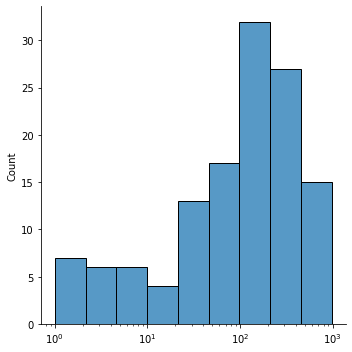

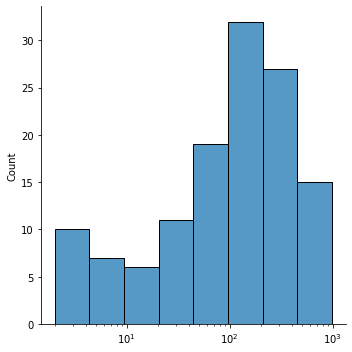

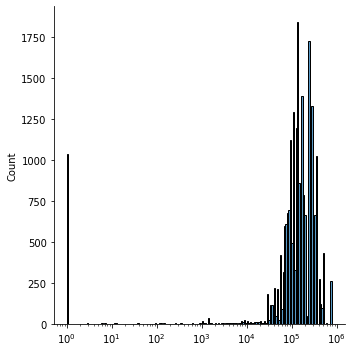

In [104]:
len_section = []
nombre_section = []
nombre_titres = []

for i in numero:
    try:
        nombre_section.append(len(sectionnos[i]))
        nombre_titres.append(len(titronos[i]))

        for sec in sectionnos[i]:
            len_section.append(len(sec.split(' ')))
    except:
        continue

import matplotlib.pyplot as plt
import seaborn as sns
sns.displot(nombre_titres,log_scale=True)
sns.displot(nombre_section,log_scale=True)
sns.displot(len_section,log_scale=True)


In [108]:
i = 40
titronos[numero[i]]
for j in range(len(sectionnos[numero[i]])):
    print(sectionnos[numero[i]][0] == sectionnos[numero[i]][j])

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [44]:
base_=base_classif_RF_1[base_classif_RF_1.num_etude==numero[i]]
print(numero[i],'\n')
for titres in base_.phrase_2.values:
     print(titres)

 Estimation des volumes d’eau consommés en phase de chantier 

3.7.3. Estimation de la nature et des quantités de matériaux/produits consommés en phase de construction et d‘exploitation 

3.7.3.1. PHASE DE CONSTRUCTION 

3.7.3.2. PHASE D’EXPLOITATION 

3.7.4. Estimation des GES générés par les différentes phases du projet 

3.7.4.1. PHASE DE CONCEPTION 

3.7.4.2. PHASE DE TRAVAUX 

3.7.4.3. PHASE D’EXPLOITATION 

3.8. ESTIMATION FINANCIERE 

3.9. SYNTHESE DES ELEMENTS DU PROJET SUSCEPTIBLES D’IMPACTER L’ENVIRONNEMENT 

4. SCENARIO DE REFERENCE ET EVOLUTION DE L’ENVIRONNEMENT 

4.1. EVOLUTION DE L’ENVIRONNEMENT EN CAS DE MISE EN OEUVRE DU PROJET 

4.2. EVOLUTION DE L’ENVIRONNEMENT EN L’ABSENCE DE MISE EN ŒUVRE DU PROJET 39

4.2.1. Evolution de l’environnement sans facteur modifiant 

4.2.2. Evolution de l’environnement associé aux risques naturels 

4.2.3. Evolution de l’environnement dû au changement climatique 

4.2.4. Evolution de l’environnement par rapport à l’aménagement du territ

## 1. Exploration d'un document

In [100]:
base=base_classif_RF[base_classif_RF.label_RF==1]


In [101]:
numero=np.unique(base.num_etude)
numero

array([ 100689,  100707,  101872,  102316,  102399,  103429,  106168,
        106905,  108485,  109735,  110185,  110277,  112358,  114799,
        115811,  117072,  118071,  120580,  120638,  121169,  123325,
        124558,  124590,  125401,  125664,  125787,  126684,  127444,
        128168,  128726,  183853,  184583,  191679,  191880,  192770,
        193746,  194051,  196672,  196719,  198830,  198953,  199469,
        199589,  200361,  200395,  201785,  203490,  205779,  207714,
        207868,  209418,  209806,  209845,  216511,  216555,  217350,
        219528,  220262,  220891,  221463,  221536,  222619,  223874,
        223973,  227302,  229223,  230723,  230816,  232382,  234071,
        234089,  235165, 1003691, 1007353, 1026759, 1052265, 1061090,
       1080573, 1092537, 1092908, 1094735, 1098697, 1124378, 1127222,
       1130980, 1132894, 1156982, 1160351, 1167766, 1177826, 1190342,
       1195294, 1206356, 1212397, 1257775, 1259674, 1261738, 1264388,
       1266931, 1287

In [51]:
i=np.random.randint(0,len(numero))

print("On considère l'étude :",numero[i])

texte=df_html[df_html.num_etude==numero[i]].texte.values[0]

titres=base[base.num_etude==numero[i]].phrase_2.values[1:]

titres_2=base[base.num_etude==numero[i]].phrase.values[1:]

titres=[t.replace('\n','') for t in titres if ('annexe' not in t.lower()) and (type(i)!=float) and ('figure' not in t.lower()) and ('tableau' not in t.lower()) and ('planche' not in t.lower())]
print("Il y a",len(titres),"titres dans l'étude.")
titres_2=[t for t in titres_2 if ('annexe' not in t.lower()) and ('figure' not in t.lower()) and ('tableau' not in t.lower()) and ('planche' not in t.lower())]
if len(titres)>0:
    print(titres[0])

    for i in titres:
        if len(texte.split(i))>2:
            print(i)

On considère l'étude : 191880
Il y a 683 titres dans l'étude.
Sommaire 3
IV. 1 Contexte politique et énergétique en France
sein du Pays Thouarsais (ZDE)
programmes
VI. 6 Impacts liés à des aménagements connexes
Météo France) 
2013)
BIOTOPE 2014) 
sur site, BIOTOPE, 2014)
(Photo Biotope, 2013)
(2011) ( Source : RP Global)
Biotope 2014
Biotope 2014
Biotope 2014
vue N°3 (Source Biotope)
2014)
de vue N°5 (Source Biotope)
(Source Biotope)
(Source Biotope)
Vigny) - point de vue N°10 (Source Biotope)
Photomontage N°29 : zoom sur le projet - éoliennes en rouge (Source Biotope)
point de vue N°15 (Source Biotope)
N°17 (Photo Biotope 2014)
depuis la RD37) - point de vue N°17 (Source Biotope)
Biotope 2014)
- point de vue N°23 (Source Biotope)
Biotope 2014)
Saint-Généroux/lrais
pour les parcs éoliens existants)
Tessonnière/Maisontiers (éoliennes en vert)
flèches en haut de cliché ; colorées en vert pour)
Sources de Seneuil, du Thouarsais et de la ZPS plane de Oiron-Thénezay
52
commune de Luzay et c

In [13]:
for i in titres:
    print(i)

PRESENTATION DES ACTEURS 
 Localisation du projet et aire d’ETUDE
 Le projet de centrale photovoltaïque 
II. 2.   Caractéristiques du projet 
II. 3.   Recyclage des modules photovoltaïques au terme de l’exploitation 
III.    Reglementation et procedures applicables au projet 
III. 1.   L’évaluation environnementale 
III. 2.   L’évaluation d’incidences sur site Natura 2000 
III. 3.   La procédure « Loi sur l’eau » 
III. 4.   Le dossier de demande de défrichement 
III. 5.   Le permis de construire 
III. 6.   Changement d’usage des terres agricoles 
I.   État initial
I. 2.    Diagnostic « Milieu physique » et « Milieu humain » 
I. 3.    Diagnostic paysager
I. 4.    Diagnostic « Milieu naturel »
 Les incidences 
I.   État initial - Milieu Physique
ii. État initial - Milieu humain
ii. 1.   Contexte socio-économique 
iii.    État initial - Paysage et patrimoine culturel 
iii. 1. Le grand paysage : au cœur du paysage en Limousin 
iii. 2.   Diagnostic paysager au droit du projet 
iii. 3.   Sen

On essaie avec un titre d'une étude

In [14]:
texte.split(titres[1])[-1]

 observer concernant ces accès ?</span></p>\n<p><span class="font24">Je vous remercie par avance et reste à votre disposition pour tout complément.</span></p>\n<p><span class="font24">Cordialement</span></p>\n<p><span class="font24">Jérémie BACCAR</span></p>\n<p><span class="font24">Chargé de projets Direction Photovoltaïque CAS</span></p>\n<p><span class="font3">La compagnie du vent</span></p>\n<p><span class="font3">Le Triade II</span></p>\n<p><span class="font3">Parc d\'activités Millénaire II</span></p>\n<p><span class="font3">215, rue Samuel Morse</span></p>\n<p><span class="font3">CS 20756</span></p>\n<p><span class="font3">34967 MONTPELLIER CEDEX 2</span></p>\n<p><span class="font3">Tel : +33(0)6 31 47 75 42</span></p>\n<p><span class="font3">Fax : +33(0)4 99 52 64 71</span></p>\n<p><a href="mailto:ieremie.baccar@compaqnieduvent.com"><span class="font3" style="text-decoration:underline;">ieremie.baccar@compaqnieduvent.com</span></a></p>\n<p><span class="font3" style="text-decora

In [ ]:
texte.split(titres[2])[-2].split(titres[1])[-1]

In [31]:
sections=[]
for i in range(len(titres)-1):
    print("\n########################################## Titres",titres[i],"\n")
    try:
        a=texte.split(titres[i+1])[-2].split(titres[i])[-1]
        print(a,"\n")
        sections.append(a)
    except:
        a="non"
        print(a,"\n")
        sections.append(a)


########################################## Titres Chapitre A 

Base aérienne 701 


########################################## Titres  -  

</span><span class="font13" style="font-weight:bold;font-variant:small-caps;"> 


########################################## Titres Presentation generale  

</span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark7"><span class="font6">o</span><span class="font8"> Cadre réglementaire </span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark8"><span class="font6">o</span><span class="font8"> Contexte des énergies renouvelables </span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark9"><span class="font8"> 


########################################## Titres 2 Contexte éolien  

</span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark10"><span class="font8"> 


########################################## Titres 4 La société SOLVEO Energie  

 - Etat ini

On essaie pour un autre numéro d'étude

In [33]:
i=0
print("On considère l'étude :",numero[i],"\n")

texte=df_html[df_html.num_etude==numero[i]].texte.values[0]

titres=base_classif_RF[base_classif_RF.num_etude==numero[i]].phrase_2.values[1:]
titres_2=base_classif_RF[base_classif_RF.num_etude==numero[i]].phrase.values[1:]

titres=[t for t in titres if ('annexe' not in t.lower()) and ('figure' not in t.lower()) and ('tableau' not in t.lower()) and ('planche' not in t.lower())]
titres_2=[t for t in titres_2 if ('annexe' not in t.lower()) and ('figure' not in t.lower()) and ('tableau' not in t.lower()) and ('planche' not in t.lower())]

print('On affiche le sommaire\n')
for i in titres:
    if len(texte.split(i))>2:
        print(i)

On considère l'étude : 100689 

On affiche le sommaire

I
Projet de centrale photovoltaïque au sol
Reconversion d’une installation de Stockage de Déchets Non Dangereux en post-exploitation
C
ommune : Saint-Yrieix-la-Perche (87)
E
tude d’impact
urbazoLor
urbo 
158
EI2332
Février 2018
Jl/L 
VU 
 B 67
Commune de Saint-Yrieix-la-Perche (87) - 
Etude d’impact
La société URBASOLAR, spécialiste du solaire photovoltaïque, souhaite, via sa filiale URBA 158, implanter une centrale photovoltaïque au sol sur le territoire de la commune de Saint-Yrieix-la-Perche, dans le département de la Haute-Vienne.
Ce projet concernera une surface clôturée de 
6,1 ha
 ».
sîn
KMO
Commune de Saint-Yrieix-la-Perche (87) - 
Etude d'impact
1
2
8° Les mesures prévues par le maître de l'ouvrage pour :
Commune de Saint-Yrieix-la-Perche (87) - 
Etude d’impact
er
Commune de Saint-Yrieix-la-Perche (87) - 
Etude d'impact
 L'entretien de la centrale solaire en exploitation
urbozoLûr
2.
Commune de Saint-Yrieix-la-Perche (87)

KeyboardInterrupt: 

In [149]:
sections=[]
for i in range(len(titres)-1):
    print("\n########################################## Titres",titres[i],"\n")
    try:
        a=texte.split(titres[i+1])[-2].split(titres[i])[-1]
        print(a,"\n")
        sections.append(a)
    except:
        a="non"
        print(a,"\n")
        sections.append(a)


########################################## Titres LE MAITRE D'OUVRAGE 

</span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark12"><span class="font24">1.2. Références et expérience</span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark13"><span class="font24">1.2.1. Les Appels d'Offres</span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark14"><span class="font24">1.2.2. Les Centrales au Sol</span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark15"><span class="font24">1.3. Solidité Financière</span></a></p></li></ul>
<ul style="list-style:none;"><li>
<p><a href="#bookmark16"><span class="font24">1.4. Moyens techniques et humains</span></a></p></li></ul>
<p><a href="#bookmark17"><span class="font25">ETUDE D'IMPACT</span></a></p>
<ul style="list-style:none;"><li>
<p><a href="#bookmark18"><span class="font24">1.</span><span class="font24" style="font-style:italic;"> DESCRIPTION DU PRO

<p><span class="font54" style="font-weight:bold;"> 


########################################## Titres 2.2.1.3. Micro-climat 

</span></p></li></ul>
<p><span class="font29">Le microclimat désigne généralement des conditions climatiques limitées à une région géographique très petite, significativement distinctes du climat général de la zone où se situe cette région.</span></p>
<p><span class="font29">Les terrains sont implantés sur les hauteurs de la vallée de la Vienne, qui est orientée suivant un axe est-ouest. La direction des vents dominants peut s'en trouver modifiée selon cet axe.</span></p>
<p><span class="font29">La zone du projet est soumise dans son ensemble, à une influence climatique de type océanique, avec des hivers doux et des étés modérément chauds et secs, pouvant entrainer des phénomènes orageux fréquents.</span></p>
<ul style="list-style:none;"><li>
<p><span class="font29">-» L'ensoleillement est relativement important localement.</span></p></li></ul>
<p><span class=

<p><span class="font54" style="font-weight:bold;"> 


########################################## Titres 2.5.2.3. Les équipements de la commune 

</span></p></li></ul>
<p><span class="font29">La commune de Saint-Brice-sur-Vienne est dotée de deux écoles élémentaires, d'un complexe sportif, d'un camping municipal, de deux salles des fêtes et d'une agence postale en mairie.</span></p>
<ul style="list-style:none;"><li>
<p><span class="font29">-» Depuis les années 2000, la population sur la commune de Saint-Brice-sur-Vienne n'a cessé de croitre.</span></p></li>
<li>
<p><span class="font29">-» La commune de Saint-Brice-sur-Vienne est située dans un contexte relativement rural.</span></p></li></ul>
<p><span class="font29">L'ERP le plus proche des terrains du projet se situe à 1,7 km à l'ouest.</span></p>
<ul style="list-style:none;"><li>
<h4><a name="bookmark139"></a><span class="font56" style="font-weight:bold;"><a name="bookmark509"></a> 


########################################## Titres 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
numero=np.unique(base_classif_RF.num_etude)

In [18]:
sections_all={}
for i in tqdm(range(len(np.unique(base.num_etude)))):
    print("On considère l'étude :",numero[i],"\n")
    
    texte=df_html[df_html.num_etude==numero[i]].texte.values[0]

    titres=base_classif_RF[base_classif_RF.num_etude==numero[i]].phrase_2.values[1:]
    #titres_2=base_classif_RF[base_classif_RF.num_etude==numero[i]].phrase.values[1:]

    titres=[t for t in titres if ('annexe' not in t.lower()) and ('figure' not in t.lower()) and ('tableau' not in t.lower()) and ('planche' not in t.lower())]
    #titres_2=[t for t in titres_2 if ('annexe' not in t.lower()) and ('figure' not in t.lower()) and ('tableau' not in t.lower()) and ('planche' not in t.lower())]

    #print('On affiche le sommaire\n')
    #for i in titres:
     #   if len(texte.split(i))>2:
      #      print(i)
    sections=[]
    for i in range(len(titres)-1):
        print("\n########################################## Titres",titres[i],"\n")
        try:
            a=texte.split(titres[i+1])[-2].split(titres[i])[-1]
            print(a,"\n")
            sections.append(a)
        except:
            a="non"
            print(a,"\n")
            sections.append(a)
    sections_all[numero[i]]=[titres,sections]

ix-la-Perche - Etat projet</span></p>
<table border="1">
<tr><td style="vertical-align:top;">
<p><span class="font20">Répartition des surfaces</span></p></td><td style="vertical-align:top;">
<p><span class="font20">Surface (en m2)</span></p></td><td style="vertical-align:top;">
<p><span class="font20">Coefficient</span></p></td><td style="vertical-align:top;">
<p><span class="font20">Surface active (en m2)</span></p></td></tr>
<tr><td style="vertical-align:middle;">
<p><span class="font5">bâtiments (PdL, PdT, LT onduleur</span></p></td><td style="vertical-align:middle;">
<p><span class="font1">148</span></p></td><td style="vertical-align:middle;">
<p><span class="font1">0,9</span></p></td><td style="vertical-align:middle;">
<p><span class="font1">133</span></p></td></tr>
<tr><td style="vertical-align:middle;">
<p><span class="font5">piste en concassé</span></p></td><td style="vertical-align:middle;">
<p><span class="font1">3085</span></p></td><td style="vertical-align:middle;">
<p><spa

IndexError: index 12582 is out of bounds for axis 0 with size 148

## 2. Généralisons à un document

In [25]:
def clean_section(section,seuil=3):
    from bs4 import BeautifulSoup
    import re
    from unidecode import unidecode
#    try:
    section=re.sub(r'[^A-Za-z]',' ',unidecode(
                    BeautifulSoup(section,"html.parser").get_text())).lower()
    section=re.sub(' +',' ',section)
    section=' '.join([i for i in section.split()])# if len(i)>seuil])
    return section


def get_sections(texte,titres):
    #from joblib import Parallel,delayed
    #import psutil
    #txt=texte[:]
    #cpu=psutil.cpu_count()
    titres=[t for t in titres if type(t)!=float]
    titres=[t for t in titres if ('annexe' not in t.lower())
                            and ('figure' not in t.lower())
                            and ('tableau' not in t.lower())
                            and ('photo' not in t.lower())
                            and ('planche' not in t.lower())]
    sec=[]
    for i in range(len(titres)-1):
        try:
            sec.append(texte.split[i+1][-2].split([i])[-1])
        except:
            sec.append("non")
            continue
        
        #if type(txt)==list:
         #   txt=''.join([i for i in txt])
        #txt=txt.split(titres[-1-i])
    #sections=[texte.split(titres[-1-i])[-1] for i in range(len(titres))] #Attention, c'est dans l'ordre inverse
        #sections.append(txt[-1])
        #txt.remove(txt[-1])
    #sections[n]=sec
    #sections=Parallel(n_jobs=cpu)(delayed(clean_section)(sections[i]) for i in range(len(sections)))
    #sections.reverse()
    #[clean_section(sections[i]) for i in range(len(sections))]
    return sec,titres#.reverse() # on remet dans l'ordre

sec={}
from tqdm import tqdm
start=time.time()
for i in tqdm(range(len(np.unique(base_classif_RF.num_etude)))):
    #### On prend une étude via son numéro
    numero=np.unique(df_html.num_etude)[i]
    #print(numero)
    #### On prend le texte
    texte=df_html[df_html.num_etude==numero].texte.values[0]
    #### On prend les titres
    titres=base_classif_RF[base_classif_RF.num_etude==numero].phrase_2.values[1:]
    sec[numero]=get_sections(texte,titres)
    #print(sec)
    #secs.append(sec)
end=time.time()
print("Durée :",round((end-start)/60,3),'minutes')
#sec

#sec=get_sections(texte,titres)

100%|██████████| 148/148 [00:06<00:00, 21.86it/s]Durée : 0.113 minutes



In [56]:
titres

e l'aire d'étude immédiate pour les mammifères terrestres (hors chiroptères)",
 "III.4 .5 \xa0\xa0Synthèse des éléments d'intérêt écologique",
 'III .5 Patrimoine culturel et paysager',
 'III.5 .1 Les unités paysagères',
 '111.5.1 .1 Les plaines de champs ouverts',
 '111.5.1 .2 Les bocages',
 '111.5.1 .3 Les vallées principales',
 '111.5.1 .4 Les plaines vallonnées et/ou boisées',
 '111.5.1 .5 Les terres viticoles',
 '111.5.1 .6 Les villes principales',
 '111.5 .2 Le patrimoine culturel',
 '111.5.2 .1 Les sites classés et inscrits',
 '111.5.2 .2 Les monuments historiques',
 '111.5.2 .3 Les secteurs sauvegardés',
 '111.5.2 .4 Les ZPPAUP/AVAP',
 '111.5.2 .5 Le patrimoine archéologique',
 '111.5 .3 Les perceptions',
 "111.5.3 .1 Topographie et aire d'influence visuelle théorique",
 '111.5.3 .2 Effets de la trame végétale',
 "111.5.3 .3 Analyse de l'occupation humaine et mise en relation avec les aires d'influence visuelle",
 "III .6 Synthèse de l'état initial",
 '111.6 .1 \xa0\xa0Milieu p

In [33]:
def remove_blank(l,carac):
    for i in range(len(l)):
        try:
            l.remove(carac)
        except:
            break
    return l
l=remove_blank(secs[1],'')
l

NameError: name 'secs' is not defined

In [36]:
i=1
print("Le numéro de l'étude considérée est :",np.unique(base_classif_RF.num_etude)[i])
remove_blank(sec[i],'')[0]

Le numéro de l'étude considérée est : 100707


KeyError: 1

In [0]:
sections=[get_sections(df_html[df_html.num_etude==i].texte.values[0],
                                          base_classif_RF[base_classif_RF.num_etude==i].phrase_2.values[1:])
                     for i in np.unique(df_html.num_etude.values)[:5] if i in np.unique(base_classif_RF.num_etude.values)]
sections

In [0]:
get_sections(df_html[df_html.num_etude==i].texte.values[0],base_classif_RF[base_classif_RF.num_etude==i].phrase_2.values[1:])

In [0]:
base_classif_RF[base_classif_RF.num_etude==i].phrase_2.values[1:]

In [0]:
np.unique(df_html.num_etude.values)

In [0]:
[i for i in np.unique(base_classif_RF.num_etude.values) if i in np.unique(df_html.num_etude.values)]

## 3. Généralisation à tous les documents

problème de float dans les titres

In [0]:
import psutil
from joblib import Parallel, delayed
import time
cpu=psutil.cpu_count()
start=time.time()
sections_all=Parallel(n_jobs=cpu)(delayed(get_sections)(df_html[df_html.num_etude==i].texte.values[0],
                                          base_classif_RF[base_classif_RF.num_etude==i].phrase_2.values[1:])
                     for i in np.unique(df_html.num_etude.values))
end=time.time()
print("Durée :",round((end-start)/60,3),'minutes')

In [0]:
sections

In [0]:
type(sections_all)

In [0]:
sections={}
numero=np.unique(base_txt.num_etude.values)
for i in numero:
    sections[i]=sections_all[list(numero).index(i)]
sections

In [0]:
sections.keys()

In [0]:
decoupage_sommaire_df = base_classif_RF_df

decoupage_sommaire = dataiku.Dataset("decoupage_sommaire")
decoupage_sommaire.write_with_schema(decoupage_sommaire_df)